In [1]:
from pathlib import Path
import torch
from flare.dataset import DatasetLoader
from types import SimpleNamespace
from scripts.flare_inference import build_flare_pipeline, run_inference, visualize_image_batch, visualize_image_buffers, prepare_mask_for_metrics, patched_flare_inference
from scripts.util import load_img
from flare.metrics.metrics import img_mse, img_psnr, img_ssim
import lpips

lpips_fn = lpips.LPIPS(net='vgg')

def lpips_batch(pred: torch.Tensor, gt: torch.Tensor, lpips_fn: lpips.LPIPS = lpips_fn):
    pred = pred * 2 - 1
    gt = gt * 2 - 1

    with torch.no_grad():
        d = lpips_fn(pred, gt)

    return d.view(-1)

/home/jsickert/miniconda3/envs/flare/lib/python3.9/site-packages/torch/utils/cpp_extension.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import packaging  # type: ignore[attr-defined]


Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/home/jsickert/miniconda3/envs/flare/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jsickert/miniconda3/envs/flare/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /home/jsickert/miniconda3/envs/flare/lib/python3.9/site-packages/lpips/weights/v0.1/vgg.pth


In [5]:
config = {
    "working_dir" : Path("/home/jsickert/adl4cv/"),
    "input_dir" : Path("DATA/001"),
    "train_dir" : ["MVI_1810", "MVI_1814"],
    "eval_dir" : ["MVI_1812"],
    "output_dir" : Path("/home/jsickert/adl4cv/adl4cv_ws25-26_Relightable-Avatars/experiments"),
    "run_name" : "001",
    "diffusion_dir" : None
}
args = SimpleNamespace(**config)

In [6]:
torch.manual_seed(42)

dataset_val = DatasetLoader(args, train_dir=args.eval_dir, sample_ratio=1, pre_load=False)
dataloader_validate = torch.utils.data.DataLoader(dataset_val, batch_size=4, collate_fn=dataset_val.collate, shuffle=False)

In [7]:
mesh, FLAMEServer, deformer_net, shader, renderer, channels_gbuffer, lgt = build_flare_pipeline(
    dataset_val=dataset_val,
    flame_path="/home/jsickert/adl4cv/adl4cv_ws25-26_Relightable-Avatars/flare/flame/FLAME2020/generic_model.pkl",
    mesh_path="/home/jsickert/adl4cv/out/002/stage_2/meshes/mesh_latest.obj",
    deformer_path="/home/jsickert/adl4cv/out/002/stage_2/network_weights/deformer_latest.pt",
    shader_path="/home/jsickert/adl4cv/out/002/stage_2/network_weights/shader_latest.pt",
    train_dir=["MVI_1814"],
)

creating the FLAME Decoder


STAGE 2: Using hashgrid (tinycudann) for intrinsic materials
{'material_mlp_ch': 5, 'light_mlp_ch': 3, 'material_mlp_dims': [64, 64], 'light_mlp_dims': [64, 64]}


In [8]:
for it, views in enumerate(dataloader_validate):
    if it == 1:
        break

print(views["frame_name"])

['5', '6', '7', '8']


## Baseline (vanilla) prediction without any changes

In [9]:
rgb_pred, gbuffers, cbuffers = run_inference(views, mesh, FLAMEServer, deformer_net, shader, renderer, channels_gbuffer, lgt)

Using /home/jsickert/.cache/torch_extensions/py39_cu116 as PyTorch extensions root...
Detected CUDA files, patching ldflags
Emitting ninja build file /home/jsickert/.cache/torch_extensions/py39_cu116/renderutils_plugin/build.ninja...
Building extension module renderutils_plugin...
Allowing ninja to set a default number of workers... (overridable by setting the environment variable MAX_JOBS=N)
Loading extension module renderutils_plugin...


ninja: no work to do.


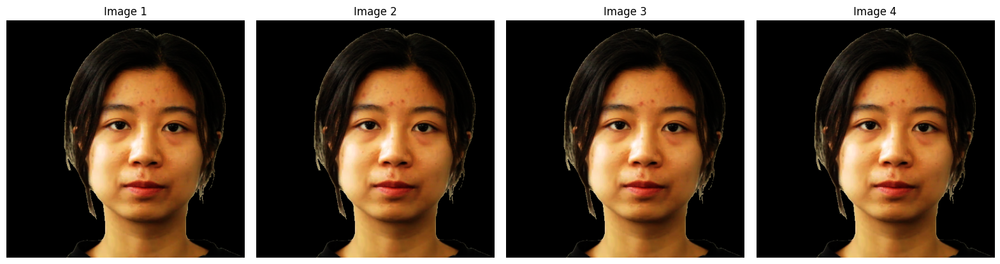

In [7]:
visualize_image_batch(views["img"])

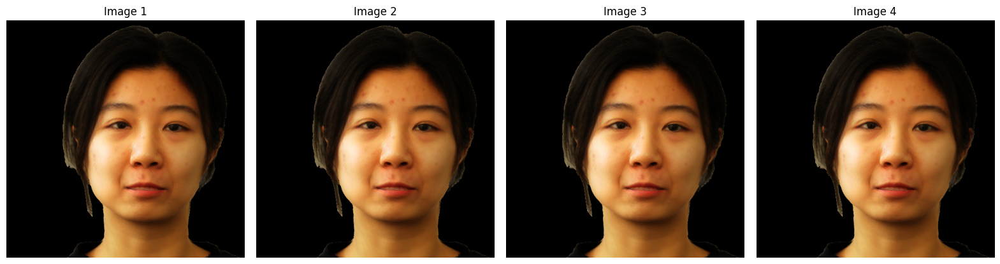

In [10]:
visualize_image_batch(rgb_pred)

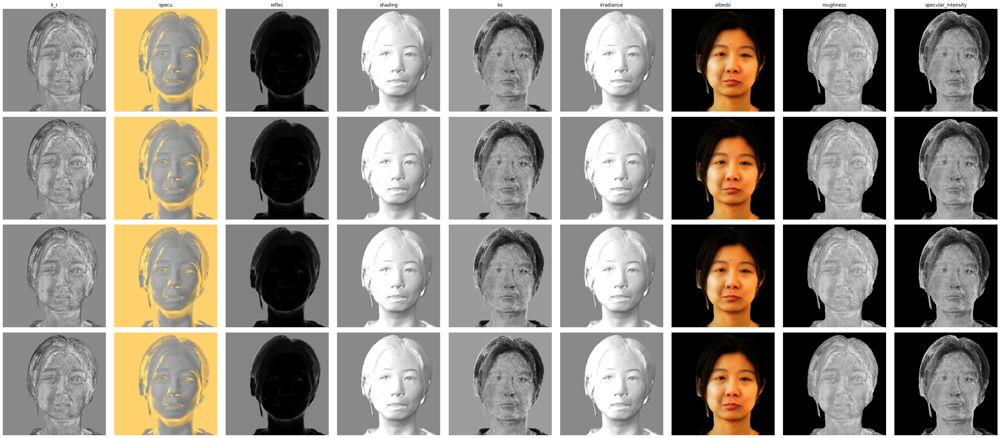

In [11]:
visualize_image_buffers(cbuffers)

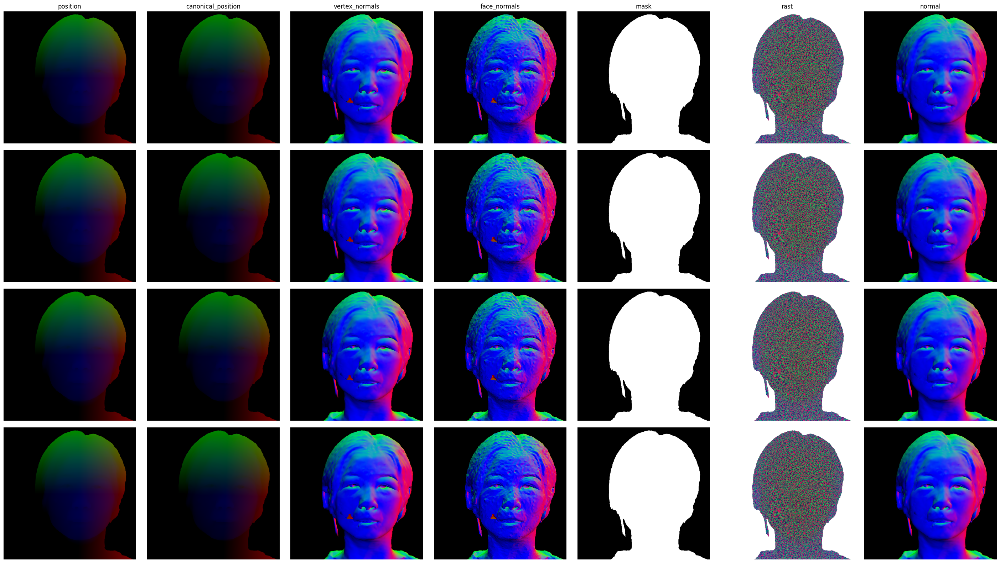

In [12]:
_gbuffers = {}
_gbuffers["position"] = gbuffers["position"]
_gbuffers["canonical_position"] = gbuffers["canonical_position"]
_gbuffers["vertex_normals"] = gbuffers["vertex_normals"]
_gbuffers["face_normals"] = gbuffers["face_normals"]
_gbuffers["mask"] = gbuffers["mask"]
_gbuffers["rast"] = gbuffers["rast"]
_gbuffers["normal"] = gbuffers["normal"]
visualize_image_buffers(_gbuffers)

In [11]:
masked_pred, gt, mask = prepare_mask_for_metrics(rgb_pred, views)

mse, error_mask_mse = img_mse(masked_pred, gt, mask=mask, use_mask=True, return_all=True)
l1, error_mask_l1 = img_mse(masked_pred, gt, mask=mask, use_mask=True, return_all=True, error_type="mae")

print("MSE  :", mse)
print("L1   :", l1)
print("SSIM :", img_ssim(masked_pred, gt))
print("PSNR :", img_psnr(masked_pred, gt, mask=mask))
print("LPIPS:", lpips_batch(masked_pred, gt))

MSE  : tensor([0.0034, 0.0035, 0.0036, 0.0037])
L1   : tensor([0.0219, 0.0221, 0.0224, 0.0227])
SSIM : tensor([0.8589, 0.8590, 0.8588, 0.8576])
PSNR : tensor([24.6611, 24.6201, 24.4707, 24.3726])
LPIPS: tensor([0.1545, 0.1518, 0.1499, 0.1520])


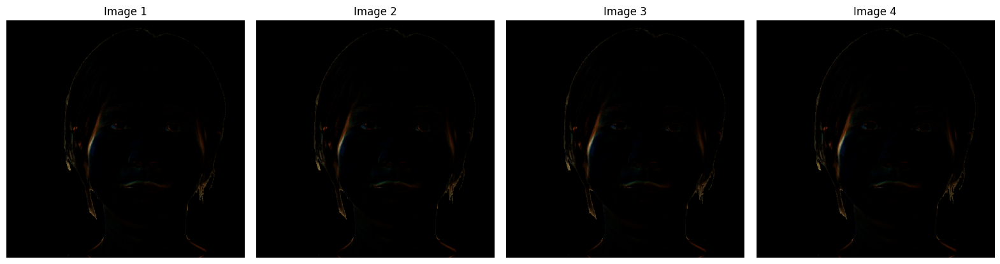

In [12]:
visualize_image_batch(error_mask_mse.permute(0, 2, 3, 1))

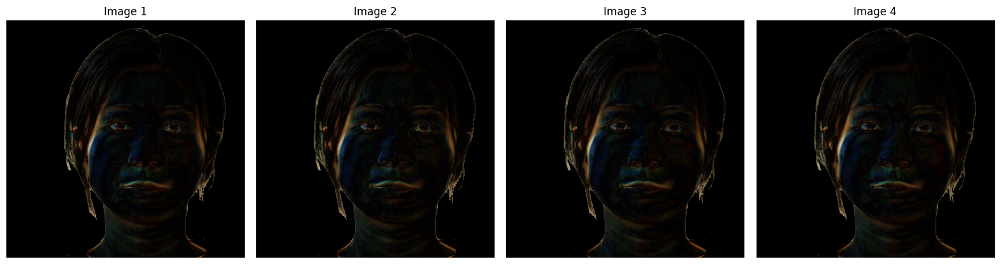

In [13]:
visualize_image_batch(error_mask_l1.permute(0, 2, 3, 1))

## Rgbx prediction

In [23]:
albedo = torch.stack(
    [
        load_img(f"/home/jsickert/adl4cv/DATA_rgbx/001/MVI_1812/{frame}.albedo.png").permute(1,2,0) # flare requires H, W, C
        for frame in views["frame_name"]
    ]
)

roughness = torch.stack(
    [
        load_img(f"/home/jsickert/adl4cv/DATA_rgbx/001/MVI_1812/{frame}.roughness.png").permute(1,2,0) # flare requires H, W, C
        for frame in views["frame_name"]
    ]
)

roughness1c = roughness[..., :1]

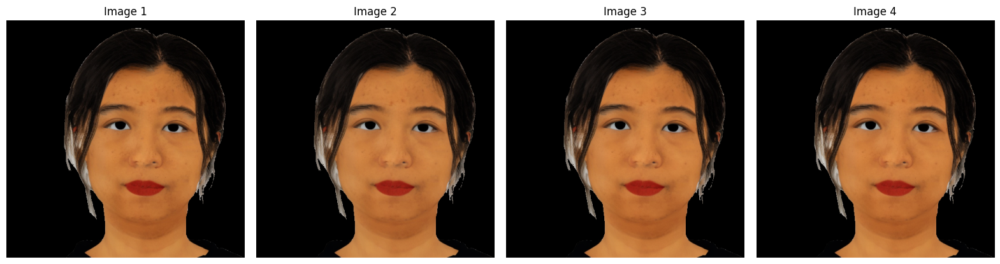

In [24]:
visualize_image_batch(albedo * views["mask"].cpu())

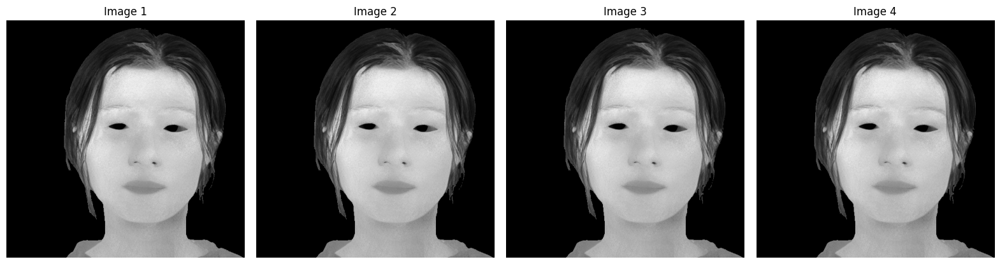

In [25]:
visualize_image_batch(roughness1c * views["mask"].cpu())

In [26]:
rgbx_rgb_pred, _, _ = patched_flare_inference(views, mesh, FLAMEServer, deformer_net, renderer, channels_gbuffer, shader_path="/home/jsickert/adl4cv/MODELS/001/stage_2/network_weights/shader_latest.pt", lgt=lgt, new_albedo=albedo)

STAGE 2: Using hashgrid (tinycudann) for intrinsic materials
{'material_mlp_ch': 5, 'light_mlp_ch': 3, 'material_mlp_dims': [64, 64], 'light_mlp_dims': [64, 64]}


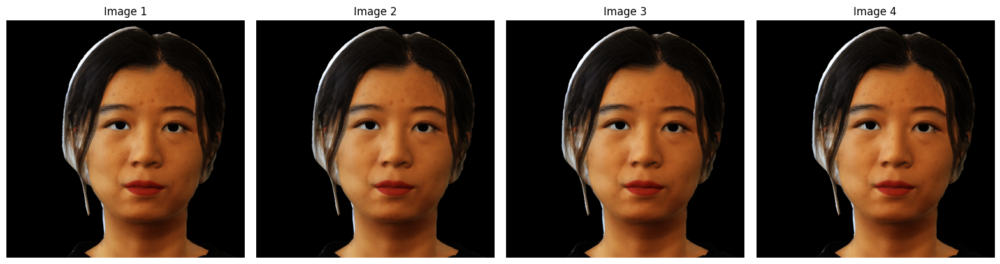

In [27]:
visualize_image_batch(rgbx_rgb_pred)

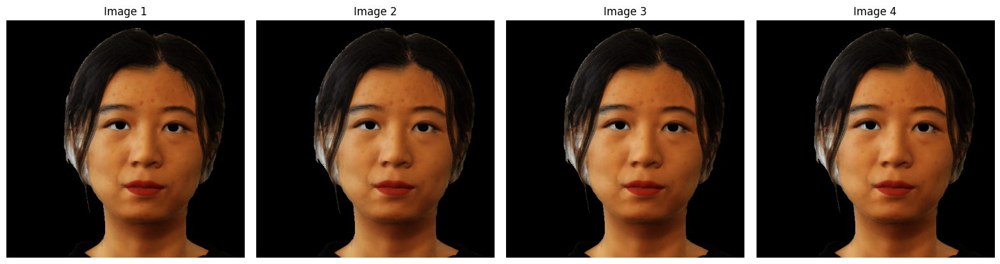

In [28]:
visualize_image_batch(rgbx_rgb_pred * views["mask"])

In [29]:
rgbx_pred, gt, mask = prepare_mask_for_metrics(rgbx_rgb_pred, views)

mse, error_mask_mse = img_mse(rgbx_pred, gt, mask=mask, use_mask=True, return_all=True)
l1, error_mask_l1 = img_mse(rgbx_pred, gt, mask=mask, use_mask=True, return_all=True, error_type="mae")

print("MSE  :", mse)
print("L1   :", l1)
print("SSIM :", img_ssim(rgbx_pred, gt))
print("PSNR :", img_psnr(rgbx_pred, gt, mask=mask))
print("LPIPS:", lpips_batch(rgbx_pred, gt))

MSE  : tensor([0.0084, 0.0086, 0.0086, 0.0089])
L1   : tensor([0.0465, 0.0470, 0.0466, 0.0473])
SSIM : tensor([0.8300, 0.8295, 0.8297, 0.8271])
PSNR : tensor([20.7524, 20.6708, 20.6672, 20.5103])
LPIPS: tensor([0.1763, 0.1736, 0.1742, 0.1760])


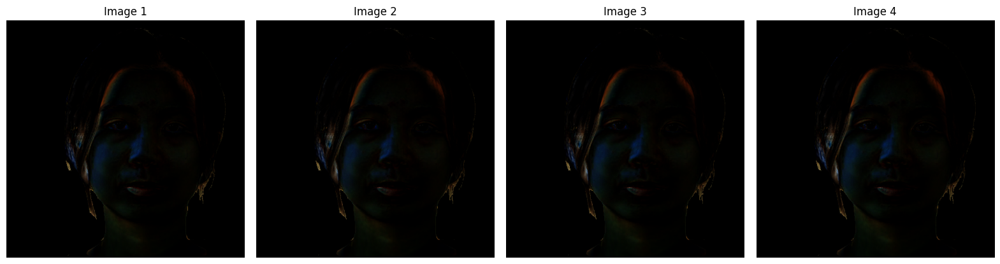

In [30]:
visualize_image_batch(error_mask_mse.permute(0, 2, 3, 1))

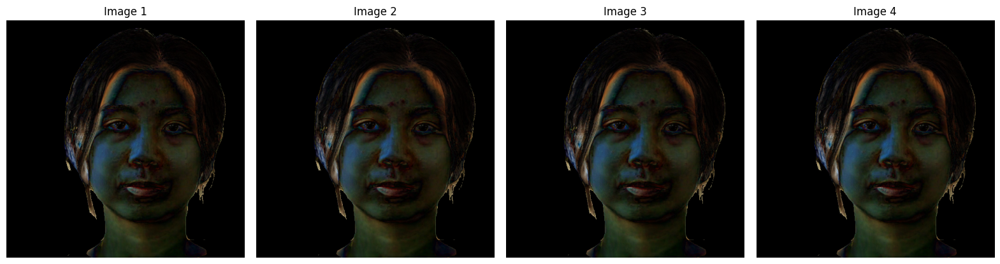

In [31]:
visualize_image_batch(error_mask_l1.permute(0, 2, 3, 1))

## Unwinding the immense mask confusion

- By default the input image `views["img"]` is masked with a 0/1 mask right at the beginning (which is loaded by `_load_mask` and is kind of broken).
- The predicted color is also masked by `gbuffers["mask"]`, which is again a 0/1 mask and is applied in this `torch.lerp` alongside with adding the alpha value. Seemingly this comes from the deformer net.
- Originally, all masks in the dataset are softmask, but this fact seems to be ignored throuhghout the whole codebase. Don't ask me why.
- Probably a more straighforward approach would be to use the softmask as is and first convert the three channels to one channels right after loading. See function `_better_load_mask`.

In [28]:
import imageio
import numpy as np

def _better_load_mask(fn: str):
    alpha = imageio.imread(fn).astype(np.float32)
    alpha = 0.299*alpha[...,0] + 0.587*alpha[...,1] + 0.114*alpha[...,2]
    alpha = torch.tensor(alpha).unsqueeze(-1)
    return alpha

## Evaluate diffusion renderer

In [32]:
from scripts.flare_inference import patched_flare_inference

dr_albedo = torch.stack(
    [
        load_img(f"/home/jsickert/adl4cv/DATA_diffusion_renderer/{frame}.png_diffuse_albedo.png").permute(1,2,0)
        for frame in views["frame_name"]
    ]
)

dr_roughness = torch.stack(
    [
        load_img(f"/home/jsickert/adl4cv/DATA_diffusion_renderer/{frame}.png_roughness.png").permute(1,2,0)
        for frame in views["frame_name"]
    ]
)

# the results see to be better when we undo the srgb -> rgb operation in _load_img


dr_roughness1c = dr_roughness[..., :1]

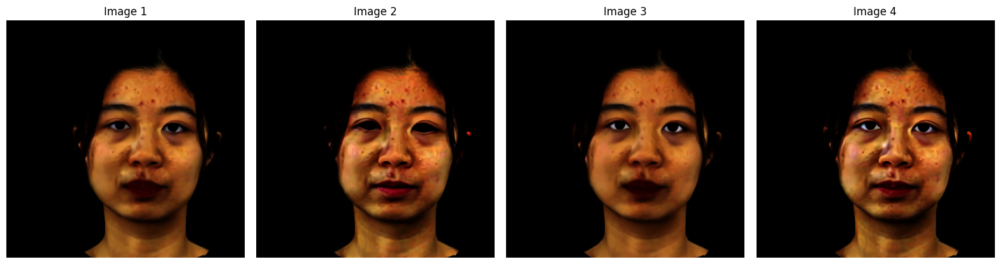

In [33]:
visualize_image_batch(dr_albedo * views["mask"].cpu())

In [35]:
dr_rgb_pred, _, _ = patched_flare_inference(views, mesh, FLAMEServer, deformer_net, renderer, channels_gbuffer, shader_path="/home/jsickert/adl4cv/MODELS/001/stage_2/network_weights/shader_latest.pt", lgt=lgt, new_albedo=dr_albedo, new_roughness=dr_roughness1c)

STAGE 2: Using hashgrid (tinycudann) for intrinsic materials
{'material_mlp_ch': 5, 'light_mlp_ch': 3, 'material_mlp_dims': [64, 64], 'light_mlp_dims': [64, 64]}


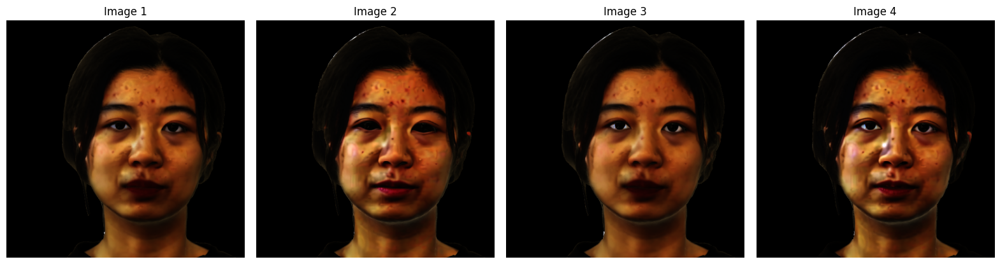

In [36]:
visualize_image_batch(dr_rgb_pred)

In [37]:
dr_pred, gt, mask = prepare_mask_for_metrics(dr_rgb_pred, views)

mse, error_mask_mse = img_mse(dr_pred, gt, mask=mask, use_mask=True, return_all=True)
l1, error_mask_l1 = img_mse(dr_pred, gt, mask=mask, use_mask=True, return_all=True, error_type="mae")

print("MSE  :", mse)
print("L1   :", l1)
print("SSIM :", img_ssim(dr_pred, gt))
print("PSNR :", img_psnr(dr_pred, gt, mask=mask))
print("LPIPS:", lpips_batch(dr_pred, gt))

MSE  : tensor([0.0202, 0.0185, 0.0210, 0.0184])
L1   : tensor([0.0744, 0.0710, 0.0758, 0.0722])
SSIM : tensor([0.7767, 0.7729, 0.7752, 0.7668])
PSNR : tensor([16.9547, 17.3358, 16.7834, 17.3478])
LPIPS: tensor([0.1790, 0.1869, 0.1819, 0.1908])


In [38]:
import numpy as np

np.mean([0.1560, 0.1556, 0.1526, 0.1573])

0.15537499999999999

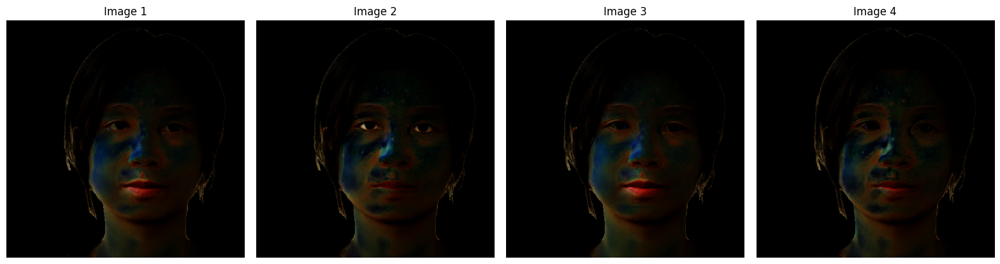

In [39]:
visualize_image_batch(error_mask_mse.permute(0, 2, 3, 1))

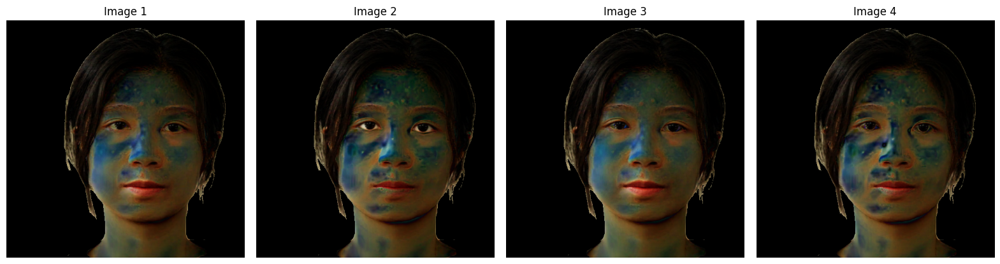

In [40]:
visualize_image_batch(error_mask_l1.permute(0, 2, 3, 1))

## Caveats
- There seam to be some issues with how rgb/srgb are treated (visibible as inconsistent saturation). Therefore we should look into this issue for more reliable results.
- The also might be some issues with how masks are applied.
- We dont have any ground truth for intrinsic channels. Thus comparing them solely relies on non-optimized re-rendering by overwriting material and lighting model outputs.
- Consistent image loading logic required for all sub-packages (flare, diffusion_renderer, rgbx)

## Results

### GT
```
MSE  : tensor([0.0034, 0.0035, 0.0036, 0.0037])
L1   : tensor([0.0219, 0.0221, 0.0224, 0.0227])
SSIM : tensor([0.8589, 0.8590, 0.8588, 0.8576])
PSNR : tensor([24.6611, 24.6201, 24.4707, 24.3726])
LPIPS: tensor([0.1545, 0.1518, 0.1499, 0.1520])
```

### RGBX
```
MSE  : tensor([0.0084, 0.0086, 0.0086, 0.0089])
L1   : tensor([0.0465, 0.0470, 0.0466, 0.0473])
SSIM : tensor([0.8300, 0.8295, 0.8297, 0.8271])
PSNR : tensor([20.7524, 20.6708, 20.6672, 20.5103])
LPIPS: tensor([0.1763, 0.1736, 0.1742, 0.1760])
```

### DiffusionRenderer
```
MSE  : tensor([0.0061, 0.0059, 0.0063, 0.0056])
L1   : tensor([0.0365, 0.0361, 0.0369, 0.0355])
SSIM : tensor([0.8476, 0.8400, 0.8451, 0.8421])
PSNR : tensor([22.1465, 22.2881, 22.0049, 22.4899])
LPIPS: tensor([0.1624, 0.1676, 0.1637, 0.1682])
```

- Generally speaking, overwriting MLP outputs with diffusion outputs worsened pixel-based metrics (such as PSNR, MSE, L1), where RGBX performed the worst.
- Percecptual based metrics did not worsen that much but also suffered some declines.
- There is a decline in performance, still as there is not optimization involved and some issues with masking and srgb disturb the metrics, the results are promising